# Week 8 - Semantic Networks

This week, we explore the representation and analysis of semantic networks. A word or document network is an unsupervized representation of text akin to a clustering or an embedding, but semantic networks can also be defined using semantic or syntactic information derived from methods we have used earlier in the quarter. For example, we can define links between words as a function of their co-presence within a document, chapter, paragraph, sentence, noun phrase or continuous bag of words. We can also define links as a function of words that rely on one another within a directed dependency parse, or links between extracted Subjects, Verbs and Objects, or nouns and the adjectives that modify them (or verbs and the adverbs that modify *them*). Rendering words linked as a network or discrete topology allows us to take advantage of the wide range of metrics and models developed for network analysis. These include measurement of network centrality, density and modularity, "block modeling" structurally equivalent relationships, andsophisticated graphical renderings of networks or network partitions that allow us to visually interrogate their structure and complexity.

For this notebook we will use the following packages:

In [1]:
#All these packages need to be installed from pip

import nltk #For POS tagging
import sklearn #For generating some matrices
import pandas #For DataFrames
import numpy as np #For arrays
import matplotlib.pyplot as plt #For plotting
import seaborn #MAkes the plots look nice
import IPython.display #For displaying images

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

#This has some C components and installs are OS specific
#See http://igraph.org/python/ for details
import igraph as ig #For the networks


import pickle #if you want to save layouts

In [22]:
#Functions for this week
def normlizeTokens(tokenLst, stopwordLst = None, stemmer = None, lemmer = None, vocab = None):
    #We can use a generator here as we just need to iterate over it

    #Lowering the case and removing non-words
    workingIter = (w.lower() for w in tokenLst if w.isalpha())

    #Now we can use the semmer, if provided
    if stemmer is not None:
        workingIter = (stemmer.stem(w) for w in workingIter)

    #And the lemmer
    if lemmer is not None:
        workingIter = (lemmer.lemmatize(w) for w in workingIter)

    #And remove the stopwords
    if stopwordLst is not None:
        workingIter = (w for w in workingIter if w not in stopwordLst)

    #We will return a list with the stopwords removed
    if vocab is not None:
        vocab_str = '|'.join(vocab)
        workingIter = (w for w in workingIter if re.match(vocab_str, w))

    return list(workingIter)

stop_words_nltk = nltk.corpus.stopwords.words('english')
snowball = nltk.stem.snowball.SnowballStemmer('english')
wordnet = nltk.stem.WordNetLemmatizer()

def wordCooccurrence(sentences, makeMatrix = False):
    words = set()
    for sent in sentences:
        words |= set(sent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in sentences:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        edges = list(zip(*np.where(coOcMat)))
        weights = coOcMat[np.where(coOcMat)]
        g = ig.Graph( n = len(wordLst),
            edges = edges,
            vertex_attrs = {'name' : wordLst, 'label' : wordLst},
            edge_attrs = {'weight' : weights}
                    )
        return g
    
def tokenize(text):
    tokenlist = nltk.word_tokenize(text)
    normalized = normlizeTokens(tokenlist, stemmer = snowball)
    return normalized

(array([  19.,   94.,   68.,   20.,   17.,   43.,   34.,   67.,   61.,
          38.,   19.,  102.,   70.,  117.,   22.,   40.]),
 array([  0.    ,   0.9375,   1.875 ,   2.8125,   3.75  ,   4.6875,
          5.625 ,   6.5625,   7.5   ,   8.4375,   9.375 ,  10.3125,
         11.25  ,  12.1875,  13.125 ,  14.0625,  15.    ]),
 <a list of 16 Patch objects>)

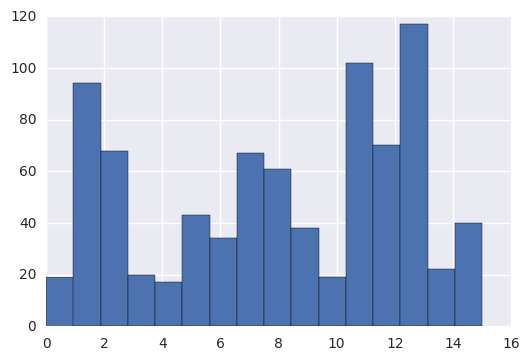

In [7]:
df = pandas.read_pickle('sub_data.pkl')
plt.hist(df['kmeans'], bins = 16)

In [14]:
#Since the largest cluster is #13, we will analyze posts that are in this cluster. 
#According the top words in this cluster, "god view believe time think don edit change..", we can safely assume that
#this cluster is related to belief and religion.
c13_df = df[df['kmeans']==13]
#c13_df.shape #(117, 5)
c13_df['tokenized_sents'] = c13_df['sub_text'].apply(lambda x: [nltk.word_tokenize(s) for s in nltk.sent_tokenize(x)])
c13_df['normalized_sents'] = c13_df['tokenized_sents'].apply(lambda x: [normlizeTokens(s, stopwordLst = None, stemmer = snowball) for s in x])

c13_df[:3]

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,sub_text,tokenized_sub,normalized_sub,kmeans,kmeans_inter,tokenized_sents,normalized_sents
9,"The fact is that the vast majority of males, e...","[The, fact, is, that, the, vast, majority, of,...","[fact, vast, major, male, especi, circumcis, h...",13,god view believe time think don edit change re...,"[[The, fact, is, that, the, vast, majority, of...","[[the, fact, is, that, the, vast, major, of, m..."
15,People at black jack tables get very upset if ...,"[People, at, black, jack, tables, get, very, u...","[peopl, black, jack, tabl, get, veri, upset, k...",13,god view believe time think don edit change re...,"[[People, at, black, jack, tables, get, very, ...","[[peopl, at, black, jack, tabl, get, veri, ups..."
35,I was just reading through [this thread](\n\nI...,"[I, was, just, reading, through, [, this, thre...","[read, thread, think, envis, struggl, transgen...",13,god view believe time think don edit change re...,"[[I, was, just, reading, through, [, this, thr...","[[i, was, just, read, through, this, thread, i..."


## <span style="color:red">*Your Turn*</span>

<span style="color:red">Construct cells immediately below this that render some reasonable networks to meaningfully characterize the structure of words and documents (or subdocuments like chapters or paragraphs) from your corpus. Also create some smaller, word neighborhood graphs. What are useful filters and thresholds and what semantic structures do they reveal that given insight into the social world and social game inscribed in your corpus?

In [15]:
g = wordCooccurrence(c13_df['normalized_sents'][:100].sum())

In [18]:
print('Number of vertices: {}'.format(g.vcount()))
print('Number of edges: {}'.format(g.ecount()))
#g.write_gml('data/c13_words.gml')
g.get_adjacency()[:10, :10]


Number of vertices: 3308
Number of edges: 297667


Matrix([[0, 0, 0, 0, 2, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

Building graphs starting with a two-mode network

In [24]:
TFVectorizer = sklearn.feature_extraction.text.CountVectorizer(stop_words=stop_words_nltk, tokenizer = tokenize)
TFVects = TFVectorizer.fit_transform(c13_df['sub_text'])
#TFVects.shape #(117, 3632)

(117, 3632)

In [28]:
#Building graph and checking if it's bipartite
INP = TFVects.todense().tolist()
g = ig.Graph.Incidence(INP, multiple=True)
g.is_bipartite() #True
g.vs['color']  = ['red']*TFVects.shape[0] + ['blue']*TFVects.shape[1]
g.vs['shape']  = ['square']*TFVects.shape[0] + ['circle']*TFVects.shape[1]

In [29]:
#With no layout
ig.plot(g, layout = None, vertex_size = 5)

A very popular layout algorithm for visualizing graphs is the Fruchterman-Reingold Algorithm, which uses a physical metaphor for lay-out. Nodes repel one another, and edges draw connected elements together like springs. The algorithm attempts to minimize the energy in such a system. For a large graph, however, the algorithm is computational demanding. The commented code gives you a layout and you can save it as a pickle. Let's then load a layout.

In [30]:
#These take a long time
#layout = g.layout_fruchterman_reingold()
#pickle.dump(layout, open( "layout.pkl", "wb" ) )
#layout = pickle.load(open('layout.pkl','rb'))

In [31]:
#A faster algorithm for large networks is the Large Graph Layout algorithm
layout = g.layout_lgl()
ig.plot(g, layout = layout, vertex_size = 5)

A two-mode network can be easily transformed into two one-mode network, enabling words to be connected to other words via the number of documents that share them, or documents to be connected to other documents via the words they share.

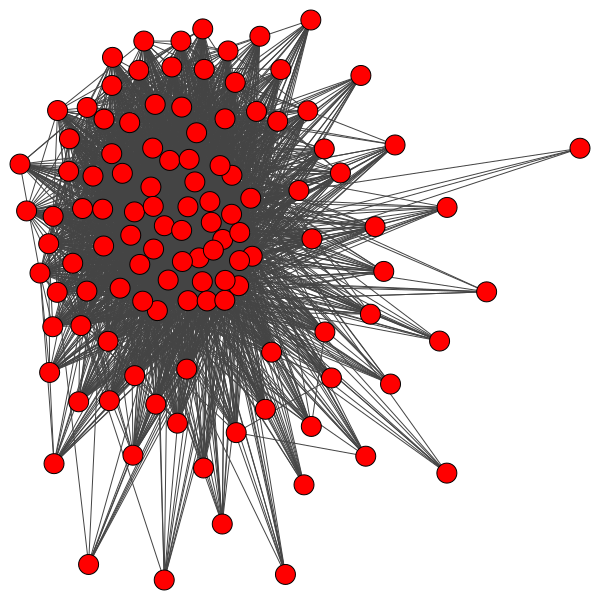

In [141]:
gDoc, gWord = g.bipartite_projection()

#gDoc.summary()

#Visualization of the graph of documents without threshold -> not very informative
#layout = gDoc.layout_fruchterman_reingold(weights = gDoc.es['weight'])
#ig.plot(gDoc, layout = layout, vertex_shape = 'circle')

#Let's binarize the adjacency matrix with some cutoff values for edge weight. 
#First, use the median weight as our cutoff threshhold.
median = np.median(gDoc.es['weight'])
medEdges = gDoc.es.select(lambda x: x['weight'] > median)
g1_d = gDoc.subgraph_edges(medEdges)
#g1_d.vs['label'] = c13_df['sub_text'].apply(lambda x: str(x)[:10])
layout = g1_d.layout_fruchterman_reingold()
ig.plot(g1_d, layout = layout, vertex_shape = 'circle')

Now let's turn it around and look at the word-to-word network (via documents). Instead of working directly with `gWord`, let's start with matrix multiplication which gives us more freedom to define edge weight. First, let's reduce the number of words to a manageable size.

Let's define the weight of an edge to the be the number of document coocurrences of two words divided by the square root of the product of their marginal frequencies.

In [39]:
TFVectorizer = sklearn.feature_extraction.text.CountVectorizer(stop_words=stop_words_nltk, tokenizer = tokenize, max_features = 200)
TFVects = TFVectorizer.fit_transform(c13_df['sub_text'])
wordsLst = TFVectorizer.get_feature_names()
TFVects.shape #(117, 200)

(117, 200)

In [41]:
A = TFVects.todense() #Get the doc-word frequency matrix.
M = np.sum(A, axis = 0) #The marginal frequencies are simplies the column sums.
W = A.T.dot(A)/np.sqrt(M.T.dot(M)) #Get out weight matrix.
np.fill_diagonal(W,0) #Set the diagonal to zero.

G = ig.Graph.Weighted_Adjacency(W.tolist(), mode=ig.ADJ_UNDIRECTED)
G.vs['name'] = wordsLst #Names are what you reference
G.vs['label'] = wordsLst #Label are what is displayed

In [42]:
ig.plot(G, layout = G.layout_fruchterman_reingold(), vertex_size = 0, edge_width = 0.1)

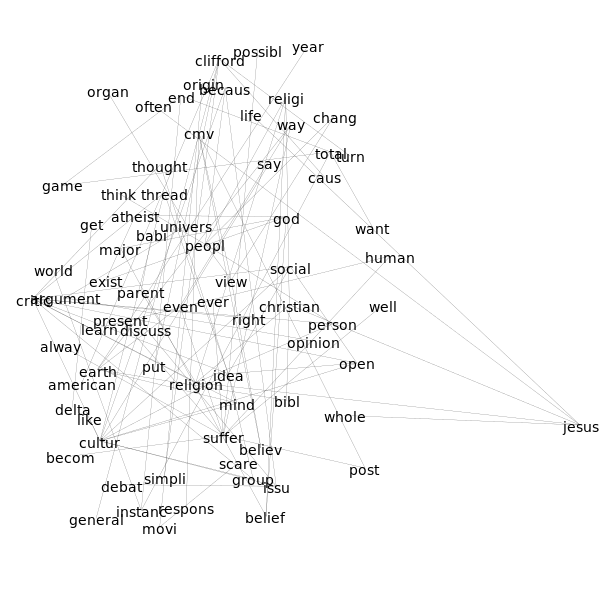

In [51]:
cutoff = 2
G_b = G.subgraph_edges(G.es.select(lambda x: x['weight'] > cutoff))
#G_b = G.subgraph_edges(G.es.select(weight_gt = cutoff))
ig.plot(G_b, layout = G.layout_fruchterman_reingold(), vertex_size = 0, edge_width = 0.2, target ='data/G_plot.png')
IPython.display.Image('data/G_plot.png')

Alternatively, there are some more informative networks statistics.

Lets begin with measures of centrality. The concept of centrality is that some nodes (words or documents) are more *central* to the network than others. There are many distinct and opposing operationalizations of this concept, however. One important concept is *betweenness* centrality, which distinguishes nodes that require the most shortest pathways between all other nodes in the network. Semantically, words with a high betweenness centrality may link distinctive domains, rather than being "central" to any one. 

## <span style="color:red">*Your Turn*</span>

<span style="color:red">Construct cells immediately below this that calculate different kinds of centrality for distinct words or documents in a network composed from your corpus of interest. Which type of words tend to be most and least central? Can you identify how different centrality measures distinguish different kind of words in your corpus? What do these patterns suggest about the semantic content and structure of your documents?

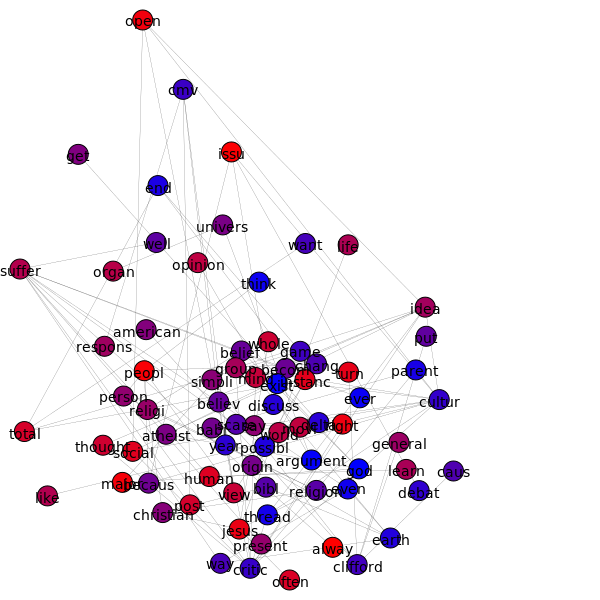

In [85]:
#G_b.vs[np.argmax(G_b.betweenness())]
pal = ig.GradientPalette("red", "blue", G_b.vcount())
G_b.vs['color'] = [pal.get(int(v)) for v in np.argsort(G_b.betweenness())]
ig.plot(G_b, layout = layout, edge_width = 0.2, target = 'data/G_b_plot.png')
IPython.display.Image('data/G_b_plot.png')

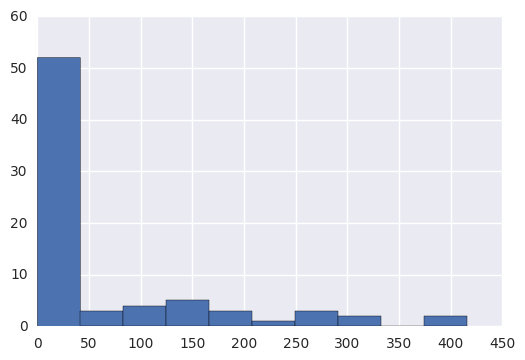

In [86]:
#Visualize the distribution of betweenness
plt.hist(G_b.betweenness())
plt.show()

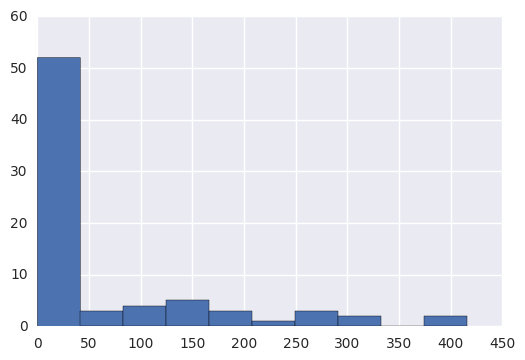

In [87]:
plt.hist([min(b, 500) for b in G_b.betweenness()])
plt.show()

Another way to visualize the graph involes the use of label sizes to represent betweenness centrality and edge widths to represent edge weight:

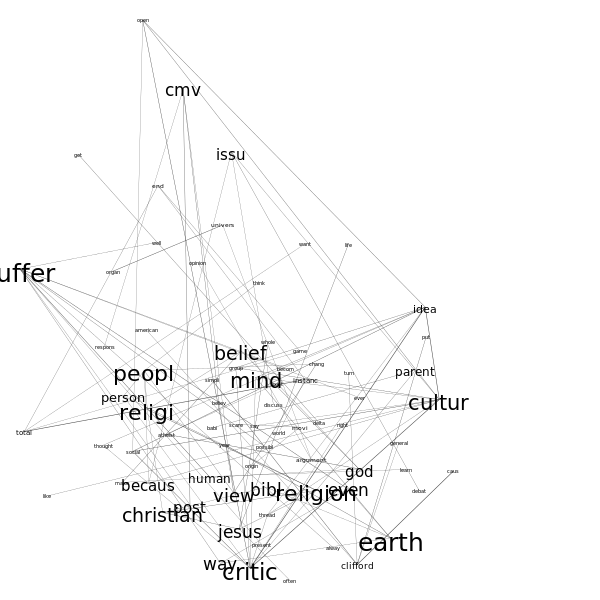

In [89]:
edge_width = (np.array(G_b.es['weight'])*0.1).tolist()
size = (5 + np.sqrt(np.array(G_b.betweenness()))).tolist()
ig.plot(G_b, layout = layout, vertex_size = 0, vertex_label_size = size, edge_width = edge_width, target = 'data/G_b_2.png')
IPython.display.Image('data/G_b_2.png')

In [90]:
#What are the top ten words in terms of betweenness
sorted(zip(G_b.vs['name'], G_b.betweenness()), key = lambda x: x[1], reverse = True)[:10]

[('suffer', 415.5333333333332),
 ('earth', 410.3999999999999),
 ('critic', 315.49999999999994),
 ('peopl', 301.9666666666668),
 ('religi', 289.6666666666667),
 ('religion', 282.6),
 ('cultur', 262.23333333333323),
 ('mind', 248.59999999999997),
 ('belief', 192.0),
 ('christian', 182.13333333333333)]

In [101]:
#What are words further down (the lowest all have centralities of 0
sorted(zip(G_b.vs['name'], G_b.betweenness()), key = lambda x: x[1], reverse = True)[25:35]

[('total', 5.0),
 ('instanc', 4.0),
 ('argument', 2.0),
 ('univers', 2.0),
 ('end', 1.0),
 ('movi', 1.0),
 ('alway', 0.0),
 ('american', 0.0),
 ('atheist', 0.0),
 ('babi', 0.0)]

Degree centrality: the number of connections possessed by each node.

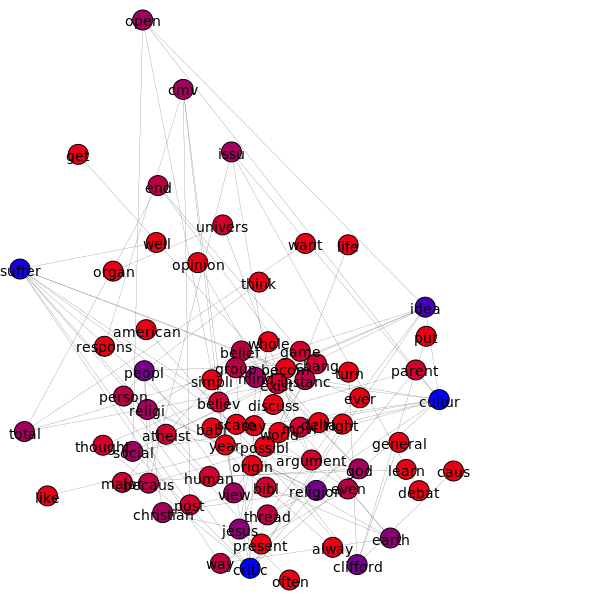

In [105]:
#G_b.vs[np.argmax(G_b.degree())]
pal = ig.GradientPalette("red", "blue", max(G_b.degree()) + 1)
G_b.vs['color'] = [pal.get(v) for v in G_b.degree()]
ig.plot(G_b, layout = layout, edge_width = 0.2, target = 'data/g_b_degreeCentrality.png')
IPython.display.Image('data/g_b_degreeCentrality.png')

In [108]:
#Top 10 words with highest degree centrality
sorted(zip(G_b.vs['name'], G_b.degree()), key = lambda x: x[1], reverse = True)[:10]

[('critic', 11),
 ('cultur', 11),
 ('suffer', 10),
 ('idea', 8),
 ('clifford', 6),
 ('peopl', 6),
 ('religion', 6),
 ('earth', 5),
 ('jesus', 5),
 ('christian', 4)]

In [109]:
#Bottom 10 words with lowest degree centrality
sorted(zip(G_b.vs['name'], G_b.degree()), key = lambda x: x[1], reverse = False)[:10]

[('alway', 1),
 ('american', 1),
 ('babi', 1),
 ('becom', 1),
 ('caus', 1),
 ('debat', 1),
 ('delta', 1),
 ('discuss', 1),
 ('ever', 1),
 ('general', 1)]

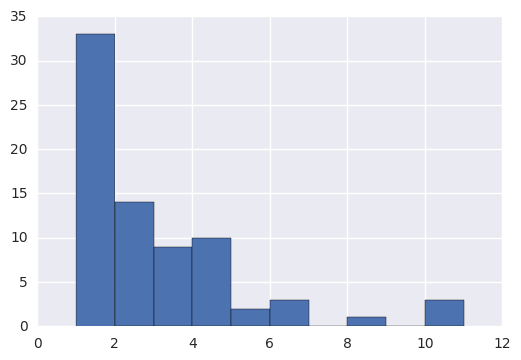

In [110]:
#Distribution of degree
plt.hist(G_b.degree())
plt.show()

Closeness centrality: average Euclidean or path distance between a node and all others in the network. 

A node with the highest closeness centrality is most likely to send a signal with the most coverage to the rest of the network.

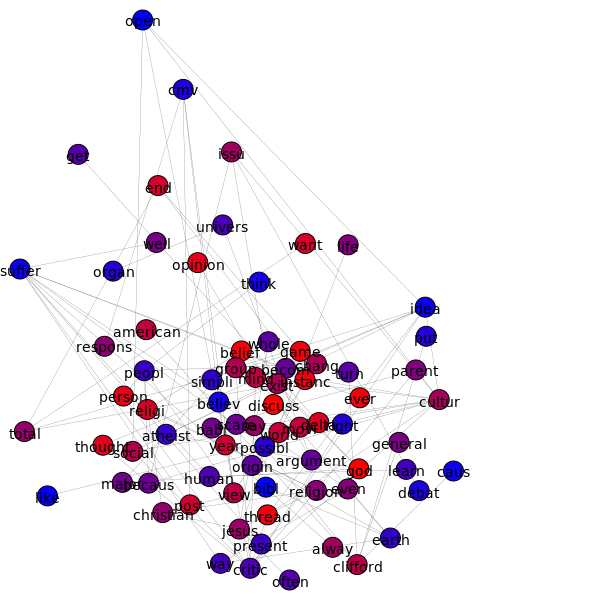

In [115]:
G_b.vs[np.argmax(G_b.closeness())]

pal = ig.GradientPalette("red", "blue", G_b.vcount())
G_b.vs['color'] = [pal.get(int(v)) for v in np.argsort(G_b.closeness())]
ig.plot(G_b, layout = layout, edge_width = 0.2, target = 'data/g_b_closeness.png')
IPython.display.Image('data/g_b_closeness.png')

In [111]:
#Top 10
sorted(zip(G_b.vs['name'], G_b.closeness()), key = lambda x: x[1], reverse = True)[:10]

[('critic', 0.041019955654102),
 ('cultur', 0.04077134986225895),
 ('mind', 0.04072647220693451),
 ('peopl', 0.04072647220693451),
 ('religion', 0.0407040704070407),
 ('christian', 0.04061470911086718),
 ('earth', 0.0405924300603401),
 ('person', 0.0405924300603401),
 ('religi', 0.0405924300603401),
 ('idea', 0.04050355774493705)]

In [112]:
#Lowest 10
sorted(zip(G_b.vs['name'], G_b.closeness()), key = lambda x: x[1], reverse = False)[:10]

[('delta', 0.013513513513513514),
 ('get', 0.013513513513513514),
 ('origin', 0.013696094762169165),
 ('scare', 0.013696094762169165),
 ('movi', 0.0136986301369863),
 ('opinion', 0.013881072969424124),
 ('organ', 0.013881072969424124),
 ('argument', 0.013886282604616251),
 ('univers', 0.013886282604616251),
 ('world', 0.014269186270728885)]

Or eignvector centrality, an approach that weights degree by the centrality of those to whom one is tied (and the degree to whom they are tied, etc.) In short, its an $n$th order degree measure.""

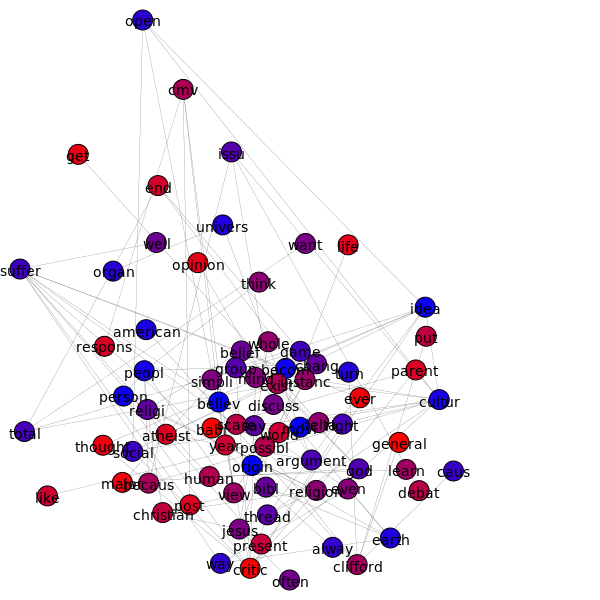

In [117]:
G_b.vs['color'] = [pal.get(int(v)) for v in np.argsort(G_b.eigenvector_centrality())]
ig.plot(G_b, layout = layout, edge_width = 0.2, target = 'data/g_b_eigenvector_centrality.png')
IPython.display.Image('data/g_b_eigenvector_centrality.png')

In [118]:
#Top10
sorted(zip(G_b.vs['name'], G_b.eigenvector_centrality()), key = lambda x: x[1], reverse = True)[:10]

[('critic', 0.9999999999999999),
 ('cultur', 0.9655724991352128),
 ('idea', 0.8961497917972703),
 ('open', 0.6147067270892662),
 ('social', 0.6147067270892662),
 ('mind', 0.5258171245748872),
 ('thread', 0.5060134794003429),
 ('group', 0.5060134794003428),
 ('thought', 0.33527968686959125),
 ('religion', 0.2700929087007178)]

In [119]:
#Lowest 10
sorted(zip(G_b.vs['name'], G_b.eigenvector_centrality()), key = lambda x: x[1], reverse = False)[:10]

[('opinion', 1.2205966557967293e-17),
 ('put', 1.409348715971481e-17),
 ('scare', 1.882154121605296e-17),
 ('argument', 1.9230504013098256e-17),
 ('organ', 2.0192769417910716e-17),
 ('delta', 2.0627176732871727e-17),
 ('general', 2.167317773300681e-17),
 ('get', 2.241338189055486e-17),
 ('world', 2.3804965706745187e-17),
 ('origin', 2.5631419465494992e-17)]

## Global stats
Density of a network: number of edges existing divided by the total number of edges possible

Clique: completely connected sets of nodes

In [120]:
G_b.density()
np.mean(G_b.degree())
G_b.diameter()

0.035315315315315315

In [122]:
G_b.largest_cliques()
print(', '.join((G_b.vs[i]['name'] for i in G_b.largest_cliques()[0])))

critic, idea, cultur, open, social


In [123]:
#Subset of our network according to the word "Religion"
rNeighbors = G_b.neighbors('religion')
rNeighborsPlus1 = set(rNeighbors)
for n in rNeighbors:
    rNeighborsPlus1 |= set(G_b.neighbors(n))
    
G_r = G_b.subgraph(G_b.vs.select(rNeighborsPlus1))
G_r.vcount() #23

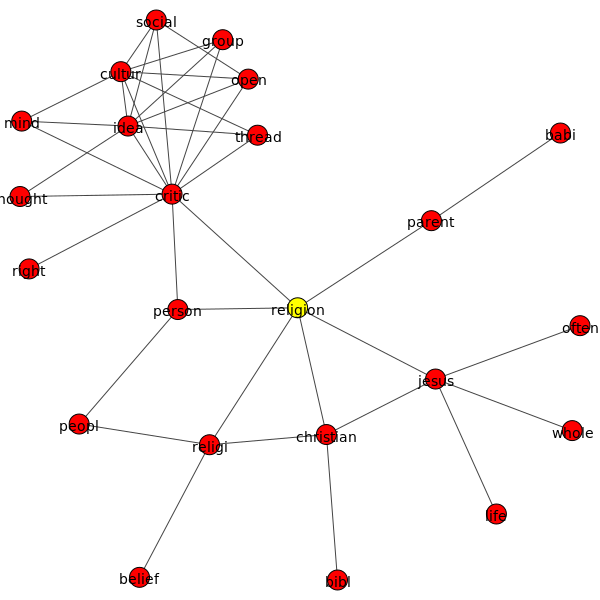

In [127]:
G_r.vs['color'] = 'red'
G_r.vs.find('religion')['color'] = 'yellow'
ig.plot(G_r, target = 'data/religion_plot.png')
IPython.display.Image('data/religion_plot.png')

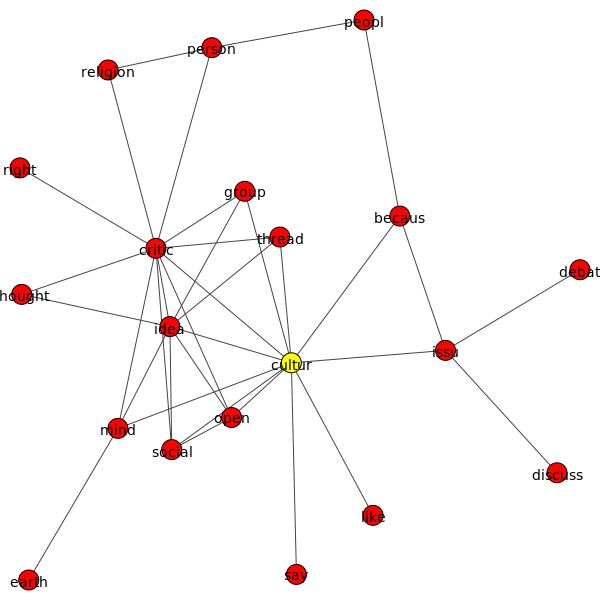

In [128]:
#Subset of our network according to the word "cultur"- culture
cNeighbors = G_b.neighbors('cultur')
cNeighborsPlus1 = set(cNeighbors)
for n in cNeighbors:
    cNeighborsPlus1 |= set(G_b.neighbors(n))
    
G_c = G_b.subgraph(G_b.vs.select(cNeighborsPlus1))
G_c.vcount() #23

G_c.vs['color'] = 'red'
G_c.vs.find('cultur')['color'] = 'yellow'
ig.plot(G_c, target = 'data/cultur_plot.png')
IPython.display.Image('data/cultur_plot.png')

## <span style="color:red">*Your Turn*</span>

<span style="color:red">Construct cells immediately below this that construct at least two different networks comprising different combinations of word types, linked by different syntactic structures, that illuminate your corpus and the dynamics you are interested to explore. Graph these networks or subnetworks within them. What are relationships that are meaningful?

# POS based networks

Now lets look at links between specific parts of speech within a network.

For this we will be using the `nltk` POS facilities instead of the Stanford ones. These are much faster, but also somewhat less accurate. (You get what you *pay* for in computational power).

Lets look at nouns co-occurring in sentences using the top 10 (by score) reddit posts:

In [52]:
def posCooccurrence(sentences, *posType, makeMatrix = False):
    pal = ig.RainbowPalette(n = len(posType))
    palMap = {p : pal.get(i) for i, p in enumerate(posType)}
    words = set()
    reducedSents = []
    #Only using the first kind of POS for each word
    wordsMap = {}
    for sent in sentences:
        s = [(w, t) for w, t in nltk.pos_tag(sent) if t in posType]
        for w, t in s:
            if w not in wordsMap:
                wordsMap[w] = t
        reducedSent = [w for w, t in s]
        words |= set(reducedSent)
        reducedSents.append(reducedSent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in reducedSents:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        edges = list(zip(*np.where(coOcMat)))
        weights = coOcMat[np.where(coOcMat)]
        kinds = [wordsMap[w] for w in wordLst]
        colours = [palMap[k] for k in kinds]
        g = ig.Graph( n = len(wordLst),
            edges = edges,
            vertex_attrs = {'name' : wordLst, 
                            'label' : wordLst, 
                            'kind' : kinds,
                            'color' : colours,
                           },
            edge_attrs = {'weight' : weights})
        return g

## Noun-noun pairs

In [53]:
gNN = posCooccurrence(c13_df['normalized_sents'].sum(), 'NN')

Edge count after trimming: 285


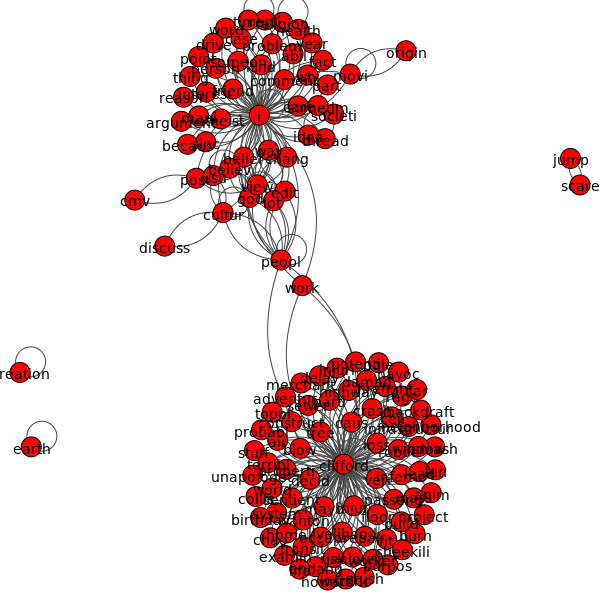

In [58]:
#gNN.vcount() #2513
#np.mean(gNN.degree()) #42.5

#Let's only keep the nodes that have a degree of 60 or above
gNN_d = gNN.subgraph(gNN.vs.select(lambda x: x.degree() > 60))
gNN_d.vcount() #412
#ig.plot(gNN_d, target = 'data/gNN_d.png')
#IPython.display.Image('data/gNN_d.png')

#trim a few edges so that only edges with higher weights are included
gNN_d = gNN_d.subgraph_edges(gNN_d.es.select(lambda x: x['weight'] > 10))
print('Edge count after trimming: {}'.format(gNN_d.ecount()))
ig.plot(gNN_d, target = 'data/gNN_d.png')
IPython.display.Image('data/gNN_d.png')


In [59]:
for e in gNN_d.es.select(lambda x: x.is_loop()):
    print(gNN_d.vs[e.source])

igraph.Vertex(<igraph.Graph object at 0x7fc2cc3dce58>, 1, {'kind': 'NN', 'name': 'god', 'color': (1.0, 0.0, 0.0, 1.0), 'label': 'god'})
igraph.Vertex(<igraph.Graph object at 0x7fc2cc3dce58>, 13, {'kind': 'NN', 'name': 'time', 'color': (1.0, 0.0, 0.0, 1.0), 'label': 'time'})
igraph.Vertex(<igraph.Graph object at 0x7fc2cc3dce58>, 20, {'kind': 'NN', 'name': 'creation', 'color': (1.0, 0.0, 0.0, 1.0), 'label': 'creation'})
igraph.Vertex(<igraph.Graph object at 0x7fc2cc3dce58>, 24, {'kind': 'NN', 'name': 'religion', 'color': (1.0, 0.0, 0.0, 1.0), 'label': 'religion'})
igraph.Vertex(<igraph.Graph object at 0x7fc2cc3dce58>, 26, {'kind': 'NN', 'name': 'earth', 'color': (1.0, 0.0, 0.0, 1.0), 'label': 'earth'})
igraph.Vertex(<igraph.Graph object at 0x7fc2cc3dce58>, 39, {'kind': 'NN', 'name': 'view', 'color': (1.0, 0.0, 0.0, 1.0), 'label': 'view'})
igraph.Vertex(<igraph.Graph object at 0x7fc2cc3dce58>, 41, {'kind': 'NN', 'name': 'peopl', 'color': (1.0, 0.0, 0.0, 1.0), 'label': 'peopl'})
igraph.Ver

In [63]:
gNV = posCooccurrence(c13_df['normalized_sents'].sum(), 'NN', 'VB')

In [66]:
gNV.ecount()
gNV_p = gNV.subgraph_edges(gNV.es.select(lambda x: gNV.vs[x.source]['kind'] != gNV.vs[x.target]['kind']))
gNV_p.ecount()
gNV_p = gNV_p.subgraph(gNV_p.vs.select(lambda x: x.degree() > 50))
gNV_p = gNV_p.subgraph_edges(gNV_p.es.select(lambda x: x['weight'] > 5))
gNV_p.vcount()

89

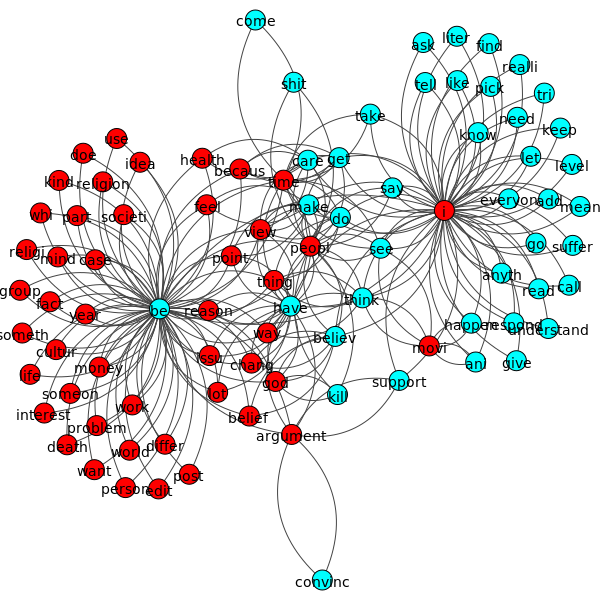

In [68]:
layoutNV = gNV_p.layout_fruchterman_reingold()
ig.plot(gNV_p, layout = layoutNV, target = 'data/gNV_p.png')
IPython.display.Image('data/gNV_p.png')

In [69]:
print(gNV_p.community_infomap(edge_weights = gNV_p.es['weight']))

Clustering with 89 elements and 13 clusters
[ 0] edit, time, use, religion, societi, reason, come, life, money, problem,
     work, whi, fact, kind, someon, doe, post, interest, year, world, mind,
     religi, point, someth, death, person, take, way, want, differ, case,
     part, group, idea, be, cultur
[ 1] find, realli, go, respond, know, everyon, need, ask, anyth, mean, keep,
     tell, level, let, like, understand, tri, read, liter, i, suffer, pick,
     add, call, give
[ 2] peopl, say
[ 3] shit, lot, have
[ 4] believ, belief, chang
[ 5] see, movi, ani, happen
[ 6] view, do
[ 7] thing, think
[ 8] god, issu, kill
[ 9] convinc, support, argument
[10] becaus, get
[11] care, health
[12] make, feel


In [71]:
#ego network for a single word
gNV_I = gNV.subgraph(gNV.vs.find('i').neighbors())
#Still need to filter it a bit to display
gNV_I.vcount() #1253
gNV_I = gNV_I.subgraph(gNV_I.vs.select(lambda x: x.degree() > 10))
gNV_I = gNV_I.subgraph_edges(gNV_I.es.select(lambda x: x['weight'] > 15))
gNV_I.vcount()

50

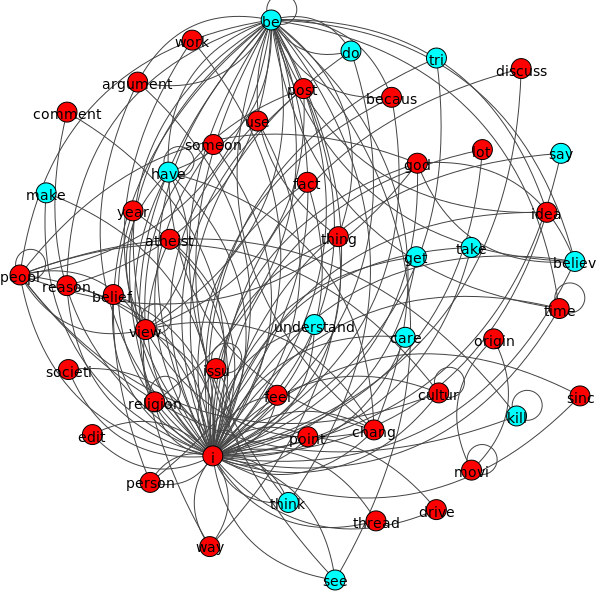

In [72]:
layoutNV_I = gNV_I.layout_fruchterman_reingold(repulserad = .001)
ig.plot(gNV_I, layout = layoutNV_I, target = 'data/gNV_I.png')
IPython.display.Image('data/gNV_I.png')

Instead of just those connect to a vertex we can find all those connected to it within 2 hops, lets look at 'stori' for this

In [75]:
gNV.vs.find('religion') #287
Neighbors = gNV.neighbors('religion')
NeighborsPlus1 = set(Neighbors)
for n in Neighbors:
    NeighborsPlus1 |= set(gNV.neighbors(n))

In [76]:
gNV_religion = gNV.subgraph(gNV.vs.select(NeighborsPlus1))
gNV_religion.vcount()

2499

In [77]:
#stats
sorted(zip(gNV_religion.vs['name'], gNV_religion.degree()), key = lambda x: x[1], reverse = True)[:10]

[('i', 2506),
 ('be', 2244),
 ('peopl', 1596),
 ('have', 908),
 ('time', 900),
 ('view', 848),
 ('way', 804),
 ('thing', 666),
 ('get', 654),
 ('point', 652)]

In [78]:
#eigenvector centrality
sorted(zip(gNV_religion.vs['name'], gNV_religion.eigenvector_centrality()), key = lambda x: x[1], reverse = True)[:10]

[('i', 1.0),
 ('be', 0.9574211682031516),
 ('peopl', 0.8815831179678659),
 ('have', 0.546121681765255),
 ('time', 0.5370930136017076),
 ('view', 0.5257013172646233),
 ('way', 0.48923214239631985),
 ('life', 0.4756576335665075),
 ('work', 0.44780539977815487),
 ('point', 0.43794902651875356)]

In [80]:
gNV_religion = gNV_religion.subgraph(gNV_religion.vs.select(lambda x: x.degree() > 5 or x['name'] == 'religion'))
gNV_religion = gNV_religion.subgraph_edges(gNV_religion.es.select(lambda x: x['weight'] > 10))
gNV_religion.vs.find('religion')['color'] = 'yellow'

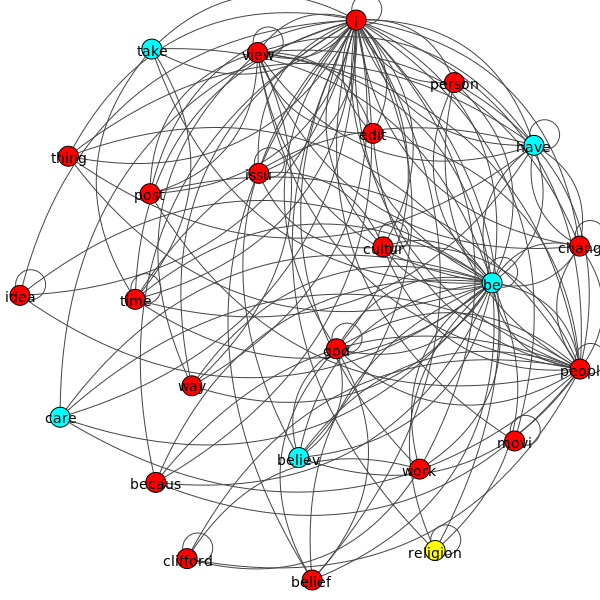

In [82]:
layoutNV_religion = gNV_religion.layout_fruchterman_reingold(repulserad = .001)
ig.plot(gNV_religion, layout = layoutNV_religion, target = 'data/gNV_religion.png')
IPython.display.Image('data/gNV_religion.png')